In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib_inline
import matplotlib.ticker as mtick

In [2]:
df=pd.read_csv(r"C:\Users\hp\Downloads\38833FF26BA1D.UnigramPreview_g9c9v27vpyspw!App\solar-powe-generation-data\Solar Power Plant Data.csv")
df.head()

,Date-Hour(NMT),WindSpeed,Sunshine,AirPressure,Radiation,AirTemperature,RelativeAirHumidity,SystemProduction
0,01.01.2017-00:00,0.6,0,1003.8,-7.4,0.1,97,0.0
1,01.01.2017-01:00,1.7,0,1003.5,-7.4,-0.2,98,0.0
2,01.01.2017-02:00,0.6,0,1003.4,-6.7,-1.2,99,0.0
3,01.01.2017-03:00,2.4,0,1003.3,-7.2,-1.3,99,0.0
4,01.01.2017-04:00,4.0,0,1003.1,-6.3,3.6,67,0.0


In [3]:
df.rename(columns={"Date-Hour(NMT)" : "Date"} , inplace=True)
df

,Date,WindSpeed,Sunshine,AirPressure,Radiation,AirTemperature,RelativeAirHumidity,SystemProduction
0,01.01.2017-00:00,0.6,0,1003.8,-7.4,0.1,97,0.0
1,01.01.2017-01:00,1.7,0,1003.5,-7.4,-0.2,98,0.0
2,01.01.2017-02:00,0.6,0,1003.4,-6.7,-1.2,99,0.0
3,01.01.2017-03:00,2.4,0,1003.3,-7.2,-1.3,99,0.0
4,01.01.2017-04:00,4.0,0,1003.1,-6.3,3.6,67,0.0
...,...,...,...,...,...,...,...,...
8755,31.12.2017-19:00,4.1,0,988.2,-4.8,-0.7,94,0.0
8756,31.12.2017-20:00,2.1,0,987.3,-5.0,-0.3,95,0.0
8757,31.12.2017-21:00,1.8,0,986.7,-5.3,0.2,93,0.0
8758,31.12.2017-22:00,2.2,0,986.0,-5.4,0.3,92,0.0


In [4]:

df['Date'] = pd.to_datetime(df['Date'], format='%d.%m.%Y-%H:%M')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 8 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Date                 8760 non-null   datetime64[ns]
 1   WindSpeed            8760 non-null   float64       
 2   Sunshine             8760 non-null   int64         
 3   AirPressure          8760 non-null   float64       
 4   Radiation            8760 non-null   float64       
 5   AirTemperature       8760 non-null   float64       
 6   RelativeAirHumidity  8760 non-null   int64         
 7   SystemProduction     8760 non-null   float64       
dtypes: datetime64[ns](1), float64(5), int64(2)
memory usage: 547.6 KB


In [5]:
df.set_index("Date" , inplace=True)
df

,WindSpeed,Sunshine,AirPressure,Radiation,AirTemperature,RelativeAirHumidity,SystemProduction
Date,,,,,,,
2017-01-01 00:00:00,0.6,0,1003.8,-7.4,0.1,97,0.0
2017-01-01 01:00:00,1.7,0,1003.5,-7.4,-0.2,98,0.0
2017-01-01 02:00:00,0.6,0,1003.4,-6.7,-1.2,99,0.0
2017-01-01 03:00:00,2.4,0,1003.3,-7.2,-1.3,99,0.0
2017-01-01 04:00:00,4.0,0,1003.1,-6.3,3.6,67,0.0
...,...,...,...,...,...,...,...
2017-12-31 19:00:00,4.1,0,988.2,-4.8,-0.7,94,0.0
2017-12-31 20:00:00,2.1,0,987.3,-5.0,-0.3,95,0.0
2017-12-31 21:00:00,1.8,0,986.7,-5.3,0.2,93,0.0


In [6]:
print(df.index.min())
print(df.index.max())

2017-01-01 00:00:00
2017-12-31 23:00:00


In [7]:
df.shape

(8760, 7)

In [8]:
df.columns

Index(['WindSpeed', 'Sunshine', 'AirPressure', 'Radiation', 'AirTemperature',
       'RelativeAirHumidity', 'SystemProduction'],
      dtype='object')

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 8760 entries, 2017-01-01 00:00:00 to 2017-12-31 23:00:00
Data columns (total 7 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   WindSpeed            8760 non-null   float64
 1   Sunshine             8760 non-null   int64  
 2   AirPressure          8760 non-null   float64
 3   Radiation            8760 non-null   float64
 4   AirTemperature       8760 non-null   float64
 5   RelativeAirHumidity  8760 non-null   int64  
 6   SystemProduction     8760 non-null   float64
dtypes: float64(5), int64(2)
memory usage: 547.5 KB


In [10]:
df.index.dtype

dtype('<M8[ns]')

In [11]:
df.dtypes

WindSpeed              float64
Sunshine                 int64
AirPressure            float64
Radiation              float64
AirTemperature         float64
RelativeAirHumidity      int64
SystemProduction       float64
dtype: object

In [12]:
df.isnull().sum()

WindSpeed              0
Sunshine               0
AirPressure            0
Radiation              0
AirTemperature         0
RelativeAirHumidity    0
SystemProduction       0
dtype: int64

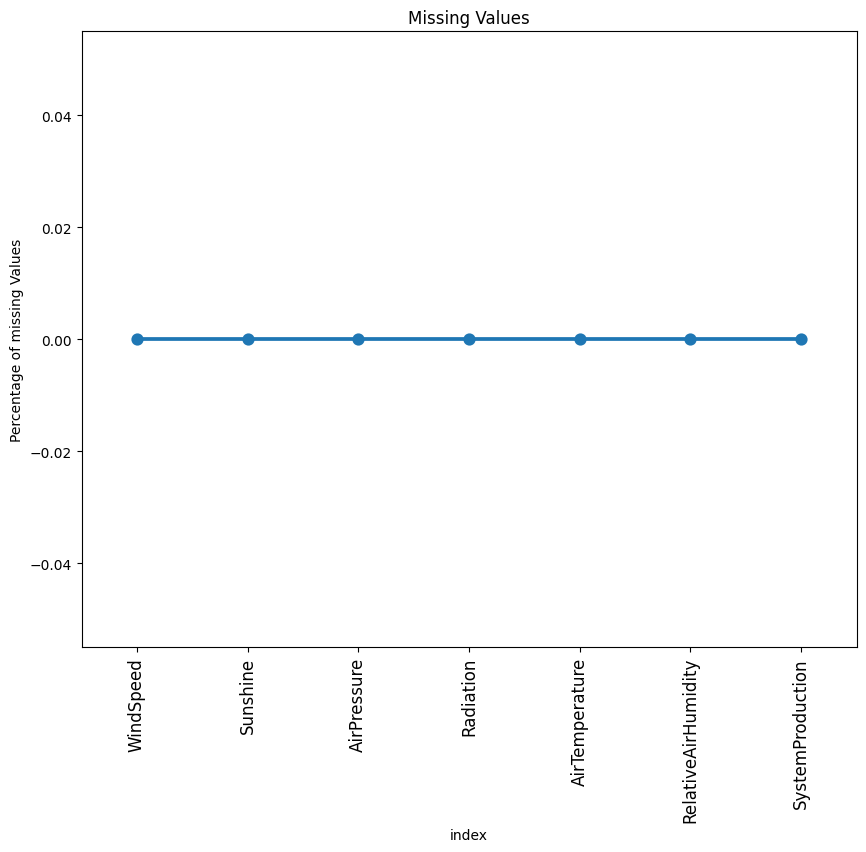

In [13]:
missing=pd.DataFrame(df.isnull().sum()/len(df)*100).reset_index()
plt.figure(figsize=(10 , 8))
ax=sns.pointplot(x="index" , y=0 , data=missing)
plt.ylabel("Percentage of missing Values")
plt.xticks(rotation=90 , fontsize=12)
plt.title("Missing Values")
plt.show()

In [14]:
df.head()

,WindSpeed,Sunshine,AirPressure,Radiation,AirTemperature,RelativeAirHumidity,SystemProduction
Date,,,,,,,
2017-01-01 00:00:00,0.6,0,1003.8,-7.4,0.1,97,0.0
2017-01-01 01:00:00,1.7,0,1003.5,-7.4,-0.2,98,0.0
2017-01-01 02:00:00,0.6,0,1003.4,-6.7,-1.2,99,0.0
2017-01-01 03:00:00,2.4,0,1003.3,-7.2,-1.3,99,0.0
2017-01-01 04:00:00,4.0,0,1003.1,-6.3,3.6,67,0.0


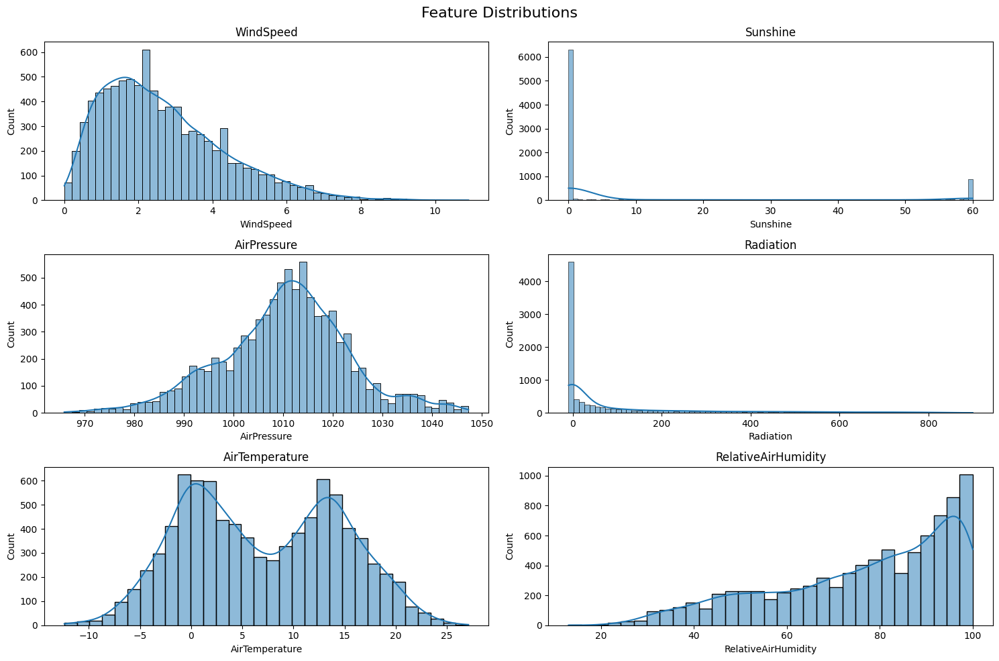

In [15]:
# Select features to plot
features = [col for col in df.columns if col != 'SystemProduction']

# Create subplots
fig, axes = plt.subplots(3, 2, figsize=(15, 10))
fig.suptitle('Feature Distributions', fontsize=16)

# Flatten the axes array
axes = axes.flatten()

# Plot histograms
for i, feature in enumerate(features):
    sns.histplot(data=df, x=feature, ax=axes[i], kde=True)
    axes[i].set_title(feature)

# Remove extra subplots if any
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

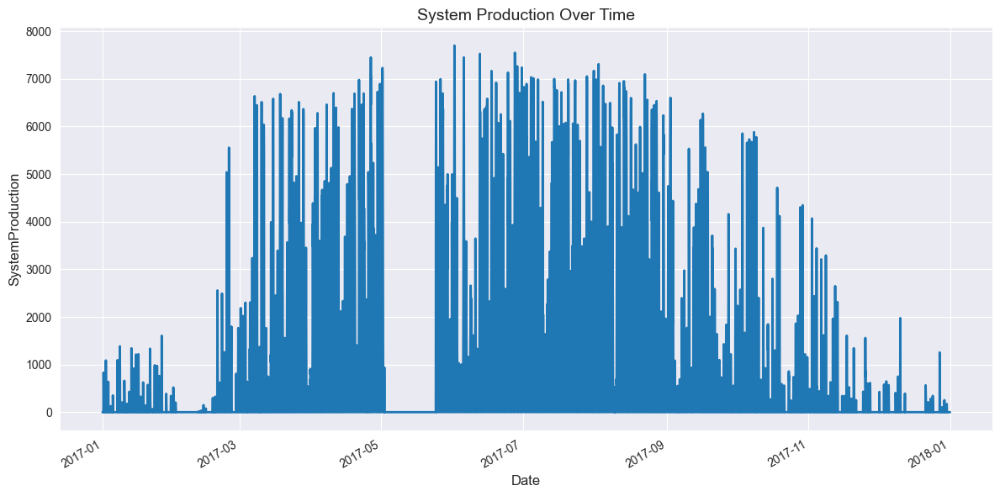

In [16]:
sns.set_style("darkgrid")  # Use seaborn's style directly instead of plt.style.use('seaborn')

# Create the figure and axis objects
fig, ax = plt.subplots(figsize=(12, 6))

# Plot the data
ax.plot(df.index, df['SystemProduction'], linewidth=2)

# Customize the plot
ax.set_xlabel('Date', fontsize=12)
ax.set_ylabel('SystemProduction', fontsize=12)
ax.set_title('System Production Over Time', fontsize=14)

# Rotate and align the tick labels so they look better
fig.autofmt_xdate()

# Use tight layout to prevent clipping of labels
plt.tight_layout()

# Show the plot
plt.show()

In [17]:
# Daily aggregation
df_daily = df.resample('D').mean()

# Weekly aggregation
df_weekly = df.resample('W').mean()

# Monthly aggregation (use 'M' for month-end frequency)
df_monthly = df.resample('ME').mean()


In [18]:
import plotly.graph_objs as go
import plotly.subplots as sp

# Create subplots with shared x-axis
fig = sp.make_subplots(rows=3, cols=1, shared_xaxes=True,
                       subplot_titles=("Daily Aggregation", "Weekly Aggregation", "Monthly Aggregation"))

# Plot daily data
fig.add_trace(go.Scatter(x=df_daily.index, y=df_daily['SystemProduction'], mode='lines', name='Daily System Production'),
              row=1, col=1)

# Plot weekly data
fig.add_trace(go.Scatter(x=df_weekly.index, y=df_weekly['SystemProduction'], mode='lines', name='Weekly System Production'),
              row=2, col=1)

# Plot monthly data
fig.add_trace(go.Scatter(x=df_monthly.index, y=df_monthly['SystemProduction'], mode='lines', name='Monthly System Production'),
              row=3, col=1)

# Update layout
fig.update_layout(height=900, width=1000, title_text="System Production Aggregation (Daily, Weekly, Monthly)",
                  xaxis_title='Date', yaxis_title='System Production (MW)')

# Display the figure
fig.show()

In [19]:
df.index.duplicated().sum()
df = df[~df.index.duplicated(keep='first')]
df = df.groupby(df.index).mean()
df=df.asfreq("h")
df

,WindSpeed,Sunshine,AirPressure,Radiation,AirTemperature,RelativeAirHumidity,SystemProduction
Date,,,,,,,
2017-01-01 00:00:00,0.6,0.0,1003.8,-7.4,0.1,97.0,0.0
2017-01-01 01:00:00,1.7,0.0,1003.5,-7.4,-0.2,98.0,0.0
2017-01-01 02:00:00,0.6,0.0,1003.4,-6.7,-1.2,99.0,0.0
2017-01-01 03:00:00,2.4,0.0,1003.3,-7.2,-1.3,99.0,0.0
2017-01-01 04:00:00,4.0,0.0,1003.1,-6.3,3.6,67.0,0.0
...,...,...,...,...,...,...,...
2017-12-31 19:00:00,4.1,0.0,988.2,-4.8,-0.7,94.0,0.0
2017-12-31 20:00:00,2.1,0.0,987.3,-5.0,-0.3,95.0,0.0
2017-12-31 21:00:00,1.8,0.0,986.7,-5.3,0.2,93.0,0.0


EXTRACTING TIME BASED FEATURES

In [20]:
df.insert(0 , "Year" , df.index.year)
df.insert(1 , "Month" , df.index.month)
df.insert(2 , "Day_of_week" , df.index.dayofweek)
df.insert(3 , "Day_of_Year" , df.index.dayofyear)
df.insert(4 , "Weekofyear" , df.index.isocalendar().week.astype(int))
df.insert(5, "is_weekend" , df.index.dayofweek.isin([5,6]))
df["is_weekend"]=df["is_weekend"].astype(int)
df.insert(6 , "Hour" , df.index.hour)
df.insert(7 , "Quarter", df.index.quarter)
df.head()


,Year,Month,Day_of_week,Day_of_Year,Weekofyear,is_weekend,Hour,Quarter,WindSpeed,Sunshine,AirPressure,Radiation,AirTemperature,RelativeAirHumidity,SystemProduction
Date,,,,,,,,,,,,,,,
2017-01-01 00:00:00,2017,1,6,1,52,1,0,1,0.6,0.0,1003.8,-7.4,0.1,97.0,0.0
2017-01-01 01:00:00,2017,1,6,1,52,1,1,1,1.7,0.0,1003.5,-7.4,-0.2,98.0,0.0
2017-01-01 02:00:00,2017,1,6,1,52,1,2,1,0.6,0.0,1003.4,-6.7,-1.2,99.0,0.0
2017-01-01 03:00:00,2017,1,6,1,52,1,3,1,2.4,0.0,1003.3,-7.2,-1.3,99.0,0.0
2017-01-01 04:00:00,2017,1,6,1,52,1,4,1,4.0,0.0,1003.1,-6.3,3.6,67.0,0.0


In [21]:
import holidays


In [22]:
df["gh_holidays"] = holidays.CountryHoliday("GH", years=df["Year"].unique())
df["gh_holidays"]


Date
2017-01-01 00:00:00    New Year's Day
2017-01-01 01:00:00               NaN
2017-01-01 02:00:00               NaN
2017-01-01 03:00:00               NaN
2017-01-01 04:00:00               NaN
                            ...      
2017-12-31 19:00:00               NaN
2017-12-31 20:00:00               NaN
2017-12-31 21:00:00               NaN
2017-12-31 22:00:00               NaN
2017-12-31 23:00:00               NaN
Freq: h, Name: gh_holidays, Length: 8760, dtype: object

In [23]:
df["gh_holidays"]=df["gh_holidays"].notnull().astype(int)
df

,Year,Month,Day_of_week,Day_of_Year,Weekofyear,is_weekend,Hour,Quarter,WindSpeed,Sunshine,AirPressure,Radiation,AirTemperature,RelativeAirHumidity,SystemProduction,gh_holidays
Date,,,,,,,,,,,,,,,,
2017-01-01 00:00:00,2017,1,6,1,52,1,0,1,0.6,0.0,1003.8,-7.4,0.1,97.0,0.0,1
2017-01-01 01:00:00,2017,1,6,1,52,1,1,1,1.7,0.0,1003.5,-7.4,-0.2,98.0,0.0,0
2017-01-01 02:00:00,2017,1,6,1,52,1,2,1,0.6,0.0,1003.4,-6.7,-1.2,99.0,0.0,0
2017-01-01 03:00:00,2017,1,6,1,52,1,3,1,2.4,0.0,1003.3,-7.2,-1.3,99.0,0.0,0
2017-01-01 04:00:00,2017,1,6,1,52,1,4,1,4.0,0.0,1003.1,-6.3,3.6,67.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-12-31 19:00:00,2017,12,6,365,52,1,19,4,4.1,0.0,988.2,-4.8,-0.7,94.0,0.0,0
2017-12-31 20:00:00,2017,12,6,365,52,1,20,4,2.1,0.0,987.3,-5.0,-0.3,95.0,0.0,0
2017-12-31 21:00:00,2017,12,6,365,52,1,21,4,1.8,0.0,986.7,-5.3,0.2,93.0,0.0,0


In [24]:
# Ghana-specific season mapping
def assign_season(month):
    if month in [11, 12, 1]: return "harmattan"
    elif month in [6, 7, 8]: return "rainy"
    else: return "dry"

df["season"] = df["Month"].apply(assign_season)
df = pd.get_dummies(df, columns=["season"], drop_first=True)  # One-hot encode season
df

,Year,Month,Day_of_week,Day_of_Year,Weekofyear,is_weekend,Hour,Quarter,WindSpeed,Sunshine,AirPressure,Radiation,AirTemperature,RelativeAirHumidity,SystemProduction,gh_holidays,season_harmattan,season_rainy
Date,,,,,,,,,,,,,,,,,,
2017-01-01 00:00:00,2017,1,6,1,52,1,0,1,0.6,0.0,1003.8,-7.4,0.1,97.0,0.0,1,True,False
2017-01-01 01:00:00,2017,1,6,1,52,1,1,1,1.7,0.0,1003.5,-7.4,-0.2,98.0,0.0,0,True,False
2017-01-01 02:00:00,2017,1,6,1,52,1,2,1,0.6,0.0,1003.4,-6.7,-1.2,99.0,0.0,0,True,False
2017-01-01 03:00:00,2017,1,6,1,52,1,3,1,2.4,0.0,1003.3,-7.2,-1.3,99.0,0.0,0,True,False
2017-01-01 04:00:00,2017,1,6,1,52,1,4,1,4.0,0.0,1003.1,-6.3,3.6,67.0,0.0,0,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-12-31 19:00:00,2017,12,6,365,52,1,19,4,4.1,0.0,988.2,-4.8,-0.7,94.0,0.0,0,True,False
2017-12-31 20:00:00,2017,12,6,365,52,1,20,4,2.1,0.0,987.3,-5.0,-0.3,95.0,0.0,0,True,False
2017-12-31 21:00:00,2017,12,6,365,52,1,21,4,1.8,0.0,986.7,-5.3,0.2,93.0,0.0,0,True,False


In [25]:
df.replace({True: 1, False: 0}, inplace=True)
df

C:\Users\hp\AppData\Local\Temp\ipykernel_720\1161774375.py:1: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



,Year,Month,Day_of_week,Day_of_Year,Weekofyear,is_weekend,Hour,Quarter,WindSpeed,Sunshine,AirPressure,Radiation,AirTemperature,RelativeAirHumidity,SystemProduction,gh_holidays,season_harmattan,season_rainy
Date,,,,,,,,,,,,,,,,,,
2017-01-01 00:00:00,2017,1,6,1,52,1,0,1,0.6,0.0,1003.8,-7.4,0.1,97.0,0.0,1,1,0
2017-01-01 01:00:00,2017,1,6,1,52,1,1,1,1.7,0.0,1003.5,-7.4,-0.2,98.0,0.0,0,1,0
2017-01-01 02:00:00,2017,1,6,1,52,1,2,1,0.6,0.0,1003.4,-6.7,-1.2,99.0,0.0,0,1,0
2017-01-01 03:00:00,2017,1,6,1,52,1,3,1,2.4,0.0,1003.3,-7.2,-1.3,99.0,0.0,0,1,0
2017-01-01 04:00:00,2017,1,6,1,52,1,4,1,4.0,0.0,1003.1,-6.3,3.6,67.0,0.0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-12-31 19:00:00,2017,12,6,365,52,1,19,4,4.1,0.0,988.2,-4.8,-0.7,94.0,0.0,0,1,0
2017-12-31 20:00:00,2017,12,6,365,52,1,20,4,2.1,0.0,987.3,-5.0,-0.3,95.0,0.0,0,1,0
2017-12-31 21:00:00,2017,12,6,365,52,1,21,4,1.8,0.0,986.7,-5.3,0.2,93.0,0.0,0,1,0


CHECKING FOR OUTLIERS

In [26]:
import plotly.express as px
from sklearn.ensemble import IsolationForest
col=df.select_dtypes(include='number').columns
Iso=IsolationForest(contamination=0.01)
outliers=Iso.fit_predict(df[col])
df_clean = df[outliers == 1]
print(f" removed {sum(outliers == -1)} outliers")



 removed 88 outliers


In [27]:
# Visualize outliers - ONLY for columns that have outliers
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# Get numeric columns for visualization
numeric_cols = df.select_dtypes(include='number').columns.tolist()

# Create outlier flag
outlier_data = df.copy()
outlier_data['outlier_flag'] = (outliers == -1)

# Find which columns have outliers
cols_with_outliers = []
for col in numeric_cols:
    if outlier_data[outlier_data['outlier_flag'] == True][col].notna().sum() > 0:
        cols_with_outliers.append(col)

print(f"\nColumns with outliers: {cols_with_outliers}")
print(f"Total columns with outliers: {len(cols_with_outliers)}\n")

# If there are outliers, create visualization
if len(cols_with_outliers) > 0:
    # Determine grid size
    num_features = len(cols_with_outliers)
    cols_per_row = 3
    rows_needed = (num_features + cols_per_row - 1) // cols_per_row
    
    fig = make_subplots(
        rows=rows_needed, cols=cols_per_row,
        subplot_titles=[f"{col}" for col in cols_with_outliers],
        specs=[[{"type": "box"} for _ in range(cols_per_row)] for _ in range(rows_needed)]
    )
    
    # Add box plots ONLY for columns with outliers
    for idx, col in enumerate(cols_with_outliers):
        row = (idx // cols_per_row) + 1
        col_num = (idx % cols_per_row) + 1
        
        # Add trace for normal points
        normal = outlier_data[outlier_data['outlier_flag'] == False][col]
        fig.add_trace(
            go.Box(y=normal, name='Normal', marker=dict(color='blue'), boxmean='sd', showlegend=(idx==0)),
            row=row, col=col_num
        )
        
        # Add trace for outlier points
        outlier_pts = outlier_data[outlier_data['outlier_flag'] == True][col]
        fig.add_trace(
            go.Box(y=outlier_pts, name='Outliers', marker=dict(color='red'), showlegend=(idx==0)),
            row=row, col=col_num
        )
    
    fig.update_layout(height=300*rows_needed, width=1400, title_text="Outlier Detection: Columns with Outliers Only", showlegend=True)
    fig.show()
else:
    print("No outliers detected in any column!")

# Summary statistics
print("\n" + "="*60)
print("OUTLIER DETECTION SUMMARY")
print("="*60)
print(f"Total records: {len(df)}")
print(f"Outliers detected: {sum(outliers == -1)}")
print(f"Outlier percentage: {100 * sum(outliers == -1) / len(df):.2f}%")
print(f"Clean records: {len(df_clean)}")
print(f"Columns affected by outliers: {len(cols_with_outliers)}")
print("="*60 + "\n")


Columns with outliers: ['Year', 'Month', 'Day_of_week', 'Day_of_Year', 'Weekofyear', 'is_weekend', 'Hour', 'Quarter', 'WindSpeed', 'Sunshine', 'AirPressure', 'Radiation', 'AirTemperature', 'RelativeAirHumidity', 'SystemProduction', 'gh_holidays', 'season_harmattan', 'season_rainy']
Total columns with outliers: 18




OUTLIER DETECTION SUMMARY
Total records: 8760
Outliers detected: 88
Outlier percentage: 1.00%
Clean records: 8672
Columns affected by outliers: 18



CREATING LAGGING AND ROLLING FEATURES


In [28]:
df["SystemProduction_24_hr_Lag"] = df["SystemProduction"].shift(24)
df["SystemProduction_168_hr_Lag"] = df["SystemProduction"].shift(168)
df.dropna(subset=["SystemProduction_24_hr_Lag", "SystemProduction_168_hr_Lag"], inplace=True)
df.head()

,Year,Month,Day_of_week,Day_of_Year,Weekofyear,is_weekend,Hour,Quarter,WindSpeed,Sunshine,AirPressure,Radiation,AirTemperature,RelativeAirHumidity,SystemProduction,gh_holidays,season_harmattan,season_rainy,SystemProduction_24_hr_Lag,SystemProduction_168_hr_Lag
Date,,,,,,,,,,,,,,,,,,,,
2017-01-08 00:00:00,2017,1,6,8,1,1,0,1,1.4,0.0,1026.9,-6.2,-4.3,90.0,0.0,0,1,0,0.0,0.0
2017-01-08 01:00:00,2017,1,6,8,1,1,1,1,1.6,0.0,1027.0,-7.1,-5.1,92.0,0.0,0,1,0,0.0,0.0
2017-01-08 02:00:00,2017,1,6,8,1,1,2,1,1.6,0.0,1026.4,-7.1,-5.6,92.0,0.0,0,1,0,0.0,0.0
2017-01-08 03:00:00,2017,1,6,8,1,1,3,1,0.8,0.0,1026.2,-6.3,-6.7,94.0,0.0,0,1,0,0.0,0.0
2017-01-08 04:00:00,2017,1,6,8,1,1,4,1,0.9,0.0,1025.7,-5.7,-6.0,92.0,0.0,0,1,0,0.0,0.0


In [29]:
# Compare SystemProduction with 24-hour and 168-hour lags using Plotly
import plotly.graph_objects as go
from plotly.subplots import make_subplots

cols = ["SystemProduction", "SystemProduction_24_hr_Lag", "SystemProduction_168_hr_Lag"]
missing = [c for c in cols if c not in df.columns]
if missing:
    print("Missing columns (can't plot):", missing)
else:
    plot_df = df[cols].dropna()
    if plot_df.empty:
        print("No rows with all lag values present (NaNs removed resulting in empty dataframe). Consider using .fillna or plotting partial series.")
    else:
        fig = go.Figure()
        fig.add_trace(go.Scatter(x=plot_df.index, y=plot_df["SystemProduction"], mode='lines', name='Actual Production', line=dict(color='yellow')))
        fig.add_trace(go.Scatter(x=plot_df.index, y=plot_df["SystemProduction_24_hr_Lag"], mode='lines', name='24hr Lag', line=dict(color='blue')))
        fig.add_trace(go.Scatter(x=plot_df.index, y=plot_df["SystemProduction_168_hr_Lag"], mode='lines', name='168hr Lag', line=dict(color='red')))

        fig.update_layout(
            title='System Production vs 24hr and 168hr Lags',
            xaxis_title='Date',
            yaxis_title='System Production',
            hovermode='x unified',
            legend=dict(orientation='h', yanchor='bottom', y=1.02, xanchor='right', x=1)
        )
        fig.show()

        # Correlation summary
        corr_24 = plot_df['SystemProduction'].corr(plot_df['SystemProduction_24_hr_Lag'])
        corr_168 = plot_df['SystemProduction'].corr(plot_df['SystemProduction_168_hr_Lag'])
        print(f"Correlation with 24hr lag: {corr_24:.4f}")
        print(f"Correlation with 168hr lag: {corr_168:.4f}")


Correlation with 24hr lag: 0.7408
Correlation with 168hr lag: 0.6523


In [30]:
df["SystemProduction_Rolling_Mean_24hr"] = df["SystemProduction"].rolling(window=24).mean()
df["SystemProduction_Rolling_Mean_168hr"] = df["SystemProduction"].rolling(window=168).mean()
df["SystemProduction_Rolling_std_24hr"] = df["SystemProduction"].rolling(window=24).std()
df["SystemProduction_Rolling_std_168hr"] = df["SystemProduction"].rolling(window=168).std()

df.dropna(subset=["SystemProduction_Rolling_Mean_24hr", "SystemProduction_Rolling_Mean_168hr",
                   "SystemProduction_Rolling_std_24hr", "SystemProduction_Rolling_std_168hr"], inplace=True)
df.head()

,Year,Month,Day_of_week,Day_of_Year,Weekofyear,is_weekend,Hour,Quarter,WindSpeed,Sunshine,...,SystemProduction,gh_holidays,season_harmattan,season_rainy,SystemProduction_24_hr_Lag,SystemProduction_168_hr_Lag,SystemProduction_Rolling_Mean_24hr,SystemProduction_Rolling_Mean_168hr,SystemProduction_Rolling_std_24hr,SystemProduction_Rolling_std_168hr
Date,,,,,,,,,,,,,,,,,,,,,
2017-01-14 23:00:00,2017,1,5,14,2,1,23,1,2.1,0.0,...,0.0,0,1,0,0.0,0.0,101.826379,70.37599,231.628859,213.254967
2017-01-15 00:00:00,2017,1,6,15,2,1,0,1,4.5,0.0,...,0.0,0,1,0,0.0,0.0,101.826379,70.37599,231.628859,213.254967
2017-01-15 01:00:00,2017,1,6,15,2,1,1,1,3.0,0.0,...,0.0,0,1,0,0.0,0.0,101.826379,70.37599,231.628859,213.254967
2017-01-15 02:00:00,2017,1,6,15,2,1,2,1,1.8,0.0,...,0.0,0,1,0,0.0,0.0,101.826379,70.37599,231.628859,213.254967
2017-01-15 03:00:00,2017,1,6,15,2,1,3,1,0.7,0.0,...,0.0,0,1,0,0.0,0.0,101.826379,70.37599,231.628859,213.254967


In [31]:
# Interactive plot: Rolling means and standard deviations
import plotly.graph_objects as go
from plotly.subplots import make_subplots

cols = [
    'SystemProduction',
    'SystemProduction_Rolling_Mean_24hr',
    'SystemProduction_Rolling_std_24hr',
    'SystemProduction_Rolling_Mean_168hr',
    'SystemProduction_Rolling_std_168hr'
]
missing = [c for c in cols if c not in df.columns]
if missing:
    print('Missing columns for rolling visualization:', missing)
else:
    plot_df = df[cols].dropna()
    if plot_df.empty:
        print('No rows with rolling statistics present after dropping NA. Consider computing rolling features or using .fillna().')
    else:
        # Downsample if too many points
        n = len(plot_df)
        if n > 20000:
            step = int(n // 20000) + 1
            plot_df = plot_df.iloc[::step]
            print(f'Downsampled to {len(plot_df)} points for plotting (step={step}).')

        fig = go.Figure()

        # 24hr mean and bands
        mean24 = plot_df['SystemProduction_Rolling_Mean_24hr']
        std24 = plot_df['SystemProduction_Rolling_std_24hr']
        upper24 = mean24 + std24
        lower24 = mean24 - std24

        fig.add_trace(go.Scatter(x=plot_df.index, y=upper24, mode='lines', line=dict(width=0), showlegend=False, name='24hr Upper'))
        fig.add_trace(go.Scatter(x=plot_df.index, y=mean24, mode='lines', line=dict(color='blue'), name='Rolling Mean 24hr'))
        fig.add_trace(go.Scatter(x=plot_df.index, y=lower24, mode='lines', line=dict(width=0), fill='tonexty', fillcolor='rgba(0,0,255,0.15)', showlegend=False, name='24hr Lower'))

        # 168hr mean and bands
        mean168 = plot_df['SystemProduction_Rolling_Mean_168hr']
        std168 = plot_df['SystemProduction_Rolling_std_168hr']
        upper168 = mean168 + std168
        lower168 = mean168 - std168

        fig.add_trace(go.Scatter(x=plot_df.index, y=upper168, mode='lines', line=dict(width=0), showlegend=False, name='168hr Upper'))
        fig.add_trace(go.Scatter(x=plot_df.index, y=mean168, mode='lines', line=dict(color='yellow'), name='Rolling Mean 168hr'))
        fig.add_trace(go.Scatter(x=plot_df.index, y=lower168, mode='lines', line=dict(width=0), fill='tonexty', fillcolor='rgba(255,0,255,0.12)', showlegend=False, name='168hr Lower'))

        # Actual production (optional baseline)
        fig.add_trace(go.Scatter(x=plot_df.index, y=plot_df['SystemProduction'], mode='lines', line=dict(color='red', width=1), name='Actual Production'))

        # Layout
        fig.update_layout(
            title='Rolling Means and Std Dev (24hr vs 168hr)',
            xaxis_title='Date',
            yaxis_title='SystemProduction',
            hovermode='x unified',
            legend=dict(orientation='h', yanchor='bottom', y=1.02, xanchor='right', x=1)
        )

        # Add interactive buttons to toggle 24hr / 168hr bands
        buttons = [
            dict(label='Show All', method='update', args=[{'visible': [True, True, True, True, True, True, True]},
                                                           {'title': 'Rolling Means and Std Dev (24hr vs 168hr)'}]),
            dict(label='24hr Only', method='update', args=[{'visible': [False, True, True, False, False, False, True]},
                                                            {'title': 'Rolling Mean & Std Dev (24hr)'}]),
            dict(label='168hr Only', method='update', args=[{'visible': [False, False, False, False, True, True, True]},
                                                             {'title': 'Rolling Mean & Std Dev (168hr)'}]),
            dict(label='Hide Bands', method='update', args=[{'visible': [False, True, False, False, True, False, True]},
                                                             {'title': 'Rolling Means (bands hidden)'}])
        ]

        fig.update_layout(
            updatemenus=[dict(type='buttons', direction='right', x=0.5, y=1.15, showactive=True, buttons=buttons)]
        )

        fig.update_xaxes(rangeslider_visible=True)
        fig.show()

        # Simple summary
        print('\nRolling stats plotted for rows:', len(plot_df))
        print('Sample values (last 5 rows):')
        display(plot_df.tail())



Rolling stats plotted for rows: 8425
Sample values (last 5 rows):


,SystemProduction,SystemProduction_Rolling_Mean_24hr,SystemProduction_Rolling_std_24hr,SystemProduction_Rolling_Mean_168hr,SystemProduction_Rolling_std_168hr
Date,,,,,
2017-12-31 19:00:00,0.0,0.0,0.0,23.644843,127.788827
2017-12-31 20:00:00,0.0,0.0,0.0,23.644843,127.788827
2017-12-31 21:00:00,0.0,0.0,0.0,23.644843,127.788827
2017-12-31 22:00:00,0.0,0.0,0.0,23.644843,127.788827
2017-12-31 23:00:00,0.0,0.0,0.0,23.644843,127.788827


In [32]:
df.head()

,Year,Month,Day_of_week,Day_of_Year,Weekofyear,is_weekend,Hour,Quarter,WindSpeed,Sunshine,...,SystemProduction,gh_holidays,season_harmattan,season_rainy,SystemProduction_24_hr_Lag,SystemProduction_168_hr_Lag,SystemProduction_Rolling_Mean_24hr,SystemProduction_Rolling_Mean_168hr,SystemProduction_Rolling_std_24hr,SystemProduction_Rolling_std_168hr
Date,,,,,,,,,,,,,,,,,,,,,
2017-01-14 23:00:00,2017,1,5,14,2,1,23,1,2.1,0.0,...,0.0,0,1,0,0.0,0.0,101.826379,70.37599,231.628859,213.254967
2017-01-15 00:00:00,2017,1,6,15,2,1,0,1,4.5,0.0,...,0.0,0,1,0,0.0,0.0,101.826379,70.37599,231.628859,213.254967
2017-01-15 01:00:00,2017,1,6,15,2,1,1,1,3.0,0.0,...,0.0,0,1,0,0.0,0.0,101.826379,70.37599,231.628859,213.254967
2017-01-15 02:00:00,2017,1,6,15,2,1,2,1,1.8,0.0,...,0.0,0,1,0,0.0,0.0,101.826379,70.37599,231.628859,213.254967
2017-01-15 03:00:00,2017,1,6,15,2,1,3,1,0.7,0.0,...,0.0,0,1,0,0.0,0.0,101.826379,70.37599,231.628859,213.254967


CHECKING SEASONALITY

In [33]:
# Interactive Monthly Seasonality Visualization with Plotly
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Aggregate data by month across all years
monthly_data = df.groupby(df.index.month)['SystemProduction'].agg(['mean', 'std', 'min', 'max']).reset_index()
monthly_data.columns = ['Month', 'Mean', 'Std', 'Min', 'Max']
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
monthly_data['Month_Name'] = monthly_data['Month'].apply(lambda x: months[int(x)-1])

# Create interactive figure with subplots
fig = make_subplots(
    rows=2, cols=1,
    subplot_titles=('Mean Production by Month with Variability', 'Min/Max Production Range'),
    specs=[[{"secondary_y": False}], [{"secondary_y": False}]],
    vertical_spacing=0.15
)

# First subplot: Bar chart with error bars
fig.add_trace(go.Bar(
    x=monthly_data['Month_Name'],
    y=monthly_data['Mean'],
    error_y=dict(type='data', array=monthly_data['Std'], color='darkgray', thickness=2),
    marker=dict(
        color=monthly_data['Mean'],
        colorscale='Viridis',
        showscale=True,
        colorbar=dict(title='Production<br>Level', x=1.15, y=0.75, len=0.4)
    ),
    name='Mean Production',
    text=monthly_data['Mean'].round(2),
    textposition='outside',
    hovertemplate='<b>%{x}</b><br>Mean: %{y:.2f}<extra></extra>'
), row=1, col=1)

# Second subplot: Min/Max range
fig.add_trace(go.Scatter(
    x=monthly_data['Month_Name'],
    y=monthly_data['Max'],
    mode='lines+markers',
    name='Max Production',
    line=dict(color='darkgreen', width=2),
    marker=dict(size=8),
    hovertemplate='<b>%{x}</b><br>Max: %{y:.2f}<extra></extra>'
), row=2, col=1)

fig.add_trace(go.Scatter(
    x=monthly_data['Month_Name'],
    y=monthly_data['Min'],
    mode='lines+markers',
    name='Min Production',
    line=dict(color='darkred', width=2),
    marker=dict(size=8),
    fill='tonexty',
    fillcolor='rgba(0,100,80,0.2)',
    hovertemplate='<b>%{x}</b><br>Min: %{y:.2f}<extra></extra>'
), row=2, col=1)

# Update layout
fig.update_xaxes(title_text='Month', row=1, col=1)
fig.update_xaxes(title_text='Month', row=2, col=1)
fig.update_yaxes(title_text='Mean Production', row=1, col=1)
fig.update_yaxes(title_text='Production (Min/Max Range)', row=2, col=1)

fig.update_layout(
    title_text='<b>Monthly System Production Seasonality Analysis</b>',
    height=800,
    width=1200,
    hovermode='x unified',
    font=dict(size=11),
    showlegend=True,
    legend=dict(orientation='v', yanchor='top', y=0.99, xanchor='right', x=0.99)
)

fig.show()

# Print detailed seasonality summary
print('\n' + '='*80)
print('MONTHLY SEASONALITY ANALYSIS SUMMARY')
print('='*80)
print(f"\n{'Month':<10} {'Mean':<12} {'Std Dev':<12} {'Min':<12} {'Max':<12}")
print('-'*80)
for _, row in monthly_data.iterrows():
    print(f"{row['Month_Name']:<10} {row['Mean']:<12.2f} {row['Std']:<12.2f} {row['Min']:<12.2f} {row['Max']:<12.2f}")

print('\n' + '-'*80)
print(f"Peak Production Month: {monthly_data.loc[monthly_data['Mean'].idxmax(), 'Month_Name']} "
      f"(Avg: {monthly_data['Mean'].max():.2f})")
print(f"Lowest Production Month: {monthly_data.loc[monthly_data['Mean'].idxmin(), 'Month_Name']} "
      f"(Avg: {monthly_data['Mean'].min():.2f})")
print(f"Production Range: {monthly_data['Mean'].max() - monthly_data['Mean'].min():.2f}")
print(f"Variability (Avg Std Dev): {monthly_data['Std'].mean():.2f}")
print('='*80)



MONTHLY SEASONALITY ANALYSIS SUMMARY

Month      Mean         Std Dev      Min          Max         
--------------------------------------------------------------------------------
Jan        74.44        227.79       0.00         1606.33     
Feb        95.89        438.84       0.00         5556.17     
Mar        769.02       1532.37      0.00         6683.50     
Apr        1287.20      1869.75      0.00         7451.33     
May        459.28       1342.23      0.00         7230.00     
Jun        1488.62      2021.80      0.00         7701.00     
Jul        1551.70      2000.79      0.00         7170.83     
Aug        1382.15      2024.99      0.00         7311.33     
Sep        630.62       1213.41      0.00         6604.17     
Oct        334.97       913.79       0.00         5882.67     
Nov        88.60        355.08       0.00         4068.83     
Dec        27.14        131.40       0.00         1976.33     

------------------------------------------------------------

In [34]:
# Interactive Quarterly Seasonality Visualization with Plotly
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Aggregate data by quarter across all years
quarterly_data = df.groupby(df.index.quarter)['SystemProduction'].agg(['mean', 'std', 'min', 'max']).reset_index()
quarterly_data.columns = ['Quarter', 'Mean', 'Std', 'Min', 'Max']
quarters = ['Q1 (Jan-Mar)', 'Q2 (Apr-Jun)', 'Q3 (Jul-Sep)', 'Q4 (Oct-Dec)']
quarterly_data['Quarter_Name'] = quarterly_data['Quarter'].apply(lambda x: quarters[int(x)-1])

# Create interactive figure with subplots
fig = make_subplots(
    rows=2, cols=1,
    subplot_titles=('Mean Production by Quarter with Variability', 'Min/Max Production Range'),
    specs=[[{"secondary_y": False}], [{"secondary_y": False}]],
    vertical_spacing=0.15
)

# First subplot: Bar chart with error bars
fig.add_trace(go.Bar(
    x=quarterly_data['Quarter_Name'],
    y=quarterly_data['Mean'],
    error_y=dict(type='data', array=quarterly_data['Std'], color='darkgray', thickness=2),
    marker=dict(
        color=quarterly_data['Mean'],
        colorscale='Plasma',
        showscale=True,
        colorbar=dict(title='Production<br>Level', x=1.15, y=0.75, len=0.4)
    ),
    name='Mean Production',
    text=quarterly_data['Mean'].round(2),
    textposition='outside',
    hovertemplate='<b>%{x}</b><br>Mean: %{y:.2f}<extra></extra>'
), row=1, col=1)

# Second subplot: Min/Max range
fig.add_trace(go.Scatter(
    x=quarterly_data['Quarter_Name'],
    y=quarterly_data['Max'],
    mode='lines+markers',
    name='Max Production',
    line=dict(color='darkgreen', width=3),
    marker=dict(size=10),
    hovertemplate='<b>%{x}</b><br>Max: %{y:.2f}<extra></extra>'
), row=2, col=1)

fig.add_trace(go.Scatter(
    x=quarterly_data['Quarter_Name'],
    y=quarterly_data['Min'],
    mode='lines+markers',
    name='Min Production',
    line=dict(color='darkred', width=3),
    marker=dict(size=10),
    fill='tonexty',
    fillcolor='rgba(0,100,80,0.2)',
    hovertemplate='<b>%{x}</b><br>Min: %{y:.2f}<extra></extra>'
), row=2, col=1)

# Update layout
fig.update_xaxes(title_text='Quarter', row=1, col=1)
fig.update_xaxes(title_text='Quarter', row=2, col=1)
fig.update_yaxes(title_text='Mean Production', row=1, col=1)
fig.update_yaxes(title_text='Production (Min/Max Range)', row=2, col=1)

fig.update_layout(
    title_text='<b>Quarterly System Production Seasonality Analysis</b>',
    height=800,
    width=1200,
    hovermode='x unified',
    font=dict(size=11),
    showlegend=True,
    legend=dict(orientation='v', yanchor='top', y=0.99, xanchor='right', x=0.99)
)

fig.show()

# Print detailed quarterly seasonality summary
print('\n' + '='*80)
print('QUARTERLY SEASONALITY ANALYSIS SUMMARY')
print('='*80)
print(f"\n{'Quarter':<20} {'Mean':<12} {'Std Dev':<12} {'Min':<12} {'Max':<12}")
print('-'*80)
for _, row in quarterly_data.iterrows():
    print(f"{row['Quarter_Name']:<20} {row['Mean']:<12.2f} {row['Std']:<12.2f} {row['Min']:<12.2f} {row['Max']:<12.2f}")

print('\n' + '-'*80)
print(f"Peak Production Quarter: {quarterly_data.loc[quarterly_data['Mean'].idxmax(), 'Quarter_Name']} "
      f"(Avg: {quarterly_data['Mean'].max():.2f})")
print(f"Lowest Production Quarter: {quarterly_data.loc[quarterly_data['Mean'].idxmin(), 'Quarter_Name']} "
      f"(Avg: {quarterly_data['Mean'].min():.2f})")
print(f"Production Range: {quarterly_data['Mean'].max() - quarterly_data['Mean'].min():.2f}")
print(f"Variability (Avg Std Dev): {quarterly_data['Std'].mean():.2f}")
print('='*80)



QUARTERLY SEASONALITY ANALYSIS SUMMARY

Quarter              Mean         Std Dev      Min          Max         
--------------------------------------------------------------------------------
Q1 (Jan-Mar)         365.50       1072.92      0.00         6683.50     
Q2 (Apr-Jun)         1071.57      1819.73      0.00         7701.00     
Q3 (Jul-Sep)         1194.22      1834.79      0.00         7311.33     
Q4 (Oct-Dec)         150.91       588.09       0.00         5882.67     

--------------------------------------------------------------------------------
Peak Production Quarter: Q3 (Jul-Sep) (Avg: 1194.22)
Lowest Production Quarter: Q4 (Oct-Dec) (Avg: 150.91)
Production Range: 1043.31
Variability (Avg Std Dev): 1328.88


SEASONAL DECOMPOSE

In [35]:
from statsmodels.tsa.seasonal import seasonal_decompose

In [36]:
# Perform seasonal decomposition with 365-day period
# Handle zero/negative values for multiplicative model
production_series = df["SystemProduction"].copy()

# If there are zero or negative values, shift to positive range
min_val = production_series.min()
if min_val <= 0:
    production_series = production_series - min_val + 1
    shift_offset = min_val
else:
    shift_offset = 0

decomposition = seasonal_decompose(production_series, model="mul", period=365)

# Extract components
trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid

# Create interactive Plotly visualization
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Remove NaN values for clean visualization
valid_mask = ~(trend.isna() | seasonal.isna() | residual.isna())
trend_clean = trend[valid_mask].dropna()
seasonal_clean = seasonal[valid_mask].dropna()
residual_clean = residual[valid_mask].dropna()

# Get matching indices for original production (use shifted series for consistency)
indices_clean = trend_clean.index
original_clean = production_series.loc[indices_clean]

# Downsample for better visualization if needed
sample_rate = max(1, len(indices_clean) // 5000)
indices = indices_clean[::sample_rate]
trend_plot = trend_clean[::sample_rate]
seasonal_plot = seasonal_clean[::sample_rate]
residual_plot = residual_clean[::sample_rate]
original_plot = original_clean[::sample_rate]

# Create subplots
fig = make_subplots(
    rows=4, cols=1,
    subplot_titles=('Original System Production', 'Trend Component', 'Seasonal Component', 'Residual (Error) Component'),
    shared_xaxes=True,
    vertical_spacing=0.08
)

# Original data
fig.add_trace(go.Scatter(
    x=indices, y=original_plot.values,
    mode='lines',
    name='Original',
    line=dict(color='black', width=1),
    hovertemplate='<b>Date:</b> %{x}<br><b>Production:</b> %{y:.2f}<extra></extra>'
), row=1, col=1)

# Trend component
fig.add_trace(go.Scatter(
    x=indices, y=trend_plot.values,
    mode='lines',
    name='Trend',
    line=dict(color='blue', width=2),
    hovertemplate='<b>Date:</b> %{x}<br><b>Trend:</b> %{y:.2f}<extra></extra>'
), row=2, col=1)

# Seasonal component
fig.add_trace(go.Scatter(
    x=indices, y=seasonal_plot.values,
    mode='lines',
    name='Seasonal',
    line=dict(color='green', width=2),
    fill='tozeroy',
    fillcolor='rgba(0,255,0,0.15)',
    hovertemplate='<b>Date:</b> %{x}<br><b>Seasonal:</b> %{y:.2f}<extra></extra>'
), row=3, col=1)

# Residual component
fig.add_trace(go.Scatter(
    x=indices, y=residual_plot.values,
    mode='markers',
    name='Residual',
    marker=dict(color='red', size=3, opacity=0.6),
    hovertemplate='<b>Date:</b> %{x}<br><b>Error:</b> %{y:.2f}<extra></extra>'
), row=4, col=1)

# Update axes labels
fig.update_yaxes(title_text='Production', row=1, col=1)
fig.update_yaxes(title_text='Trend', row=2, col=1)
fig.update_yaxes(title_text='Seasonal', row=3, col=1)
fig.update_yaxes(title_text='Error', row=4, col=1)

fig.update_xaxes(title_text='Date', row=4, col=1)

# Update layout
fig.update_layout(
    title_text='<b>Time Series Decomposition: Trend, Seasonality & Residuals (Multiplicative Model)</b>',
    height=1000,
    width=1400,
    hovermode='x unified',
    showlegend=True,
    font=dict(size=10)
)

fig.show()

In [37]:
# Autocorrelation and Partial Autocorrelation Analysis using Plotly
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import acf, pacf
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import numpy as np

# Prepare data - use the cleaned SystemProduction series
data_for_acf = df["SystemProduction"].dropna()

# Calculate ACF and PACF values
acf_values = acf(data_for_acf, nlags=50, fft=False)
pacf_values = pacf(data_for_acf, nlags=50, method='ywm')

# Calculate confidence intervals (95%)
n = len(data_for_acf)
conf_int = 1.96 / np.sqrt(n)

# Create lags array
lags = np.arange(len(acf_values))

# Create subplots with ACF and PACF
fig = make_subplots(
    rows=2, cols=1,
    subplot_titles=('Autocorrelation Function (ACF)', 'Partial Autocorrelation Function (PACF)'),
    vertical_spacing=0.15
)

# ACF plot
fig.add_trace(go.Bar(
    x=lags,
    y=acf_values,
    name='ACF',
    marker=dict(color='steelblue'),
    hovertemplate='<b>Lag:</b> %{x}<br><b>ACF:</b> %{y:.4f}<extra></extra>',
    showlegend=True
), row=1, col=1)

# Add confidence interval bands for ACF
fig.add_hline(y=conf_int, line_dash='dash', line_color='red', annotation_text='95% CI', row=1, col=1)
fig.add_hline(y=-conf_int, line_dash='dash', line_color='red', row=1, col=1)
fig.add_hline(y=0, line_color='black', line_width=1, row=1, col=1)

# PACF plot
fig.add_trace(go.Bar(
    x=lags,
    y=pacf_values,
    name='PACF',
    marker=dict(color='darkorange'),
    hovertemplate='<b>Lag:</b> %{x}<br><b>PACF:</b> %{y:.4f}<extra></extra>',
    showlegend=True
), row=2, col=1)

# Add confidence interval bands for PACF
fig.add_hline(y=conf_int, line_dash='dash', line_color='red', annotation_text='95% CI', row=2, col=1)
fig.add_hline(y=-conf_int, line_dash='dash', line_color='red', row=2, col=1)
fig.add_hline(y=0, line_color='black', line_width=1, row=2, col=1)

# Update layout
fig.update_xaxes(title_text='Lag', row=1, col=1)
fig.update_xaxes(title_text='Lag', row=2, col=1)
fig.update_yaxes(title_text='ACF Value', row=1, col=1)
fig.update_yaxes(title_text='PACF Value', row=2, col=1)

fig.update_layout(
    title_text='<b>Autocorrelation Analysis: ACF & PACF (System Production)</b>',
    height=900,
    width=1200,
    hovermode='x unified',
    font=dict(size=11),
    showlegend=True
)

fig.show()

# Print summary statistics
print('\n' + '='*80)
print('AUTOCORRELATION ANALYSIS SUMMARY')
print('='*80)
print(f"\nSeries Length: {n}")
print(f"95% Confidence Interval: ±{conf_int:.6f}")
print(f"\nTop 10 Significant ACF Lags (by absolute value):")
print(f"{'Lag':<8} {'ACF Value':<15} {'Significant':<15}")
print('-'*80)

acf_sorted = sorted(enumerate(acf_values[1:], 1), key=lambda x: abs(x[1]), reverse=True)[:10]
for lag, acf_val in acf_sorted:
    significant = "Yes" if abs(acf_val) > conf_int else "No"
    print(f"{lag:<8} {acf_val:<15.6f} {significant:<15}")

print(f"\nTop 10 Significant PACF Lags (by absolute value):")
print(f"{'Lag':<8} {'PACF Value':<15} {'Significant':<15}")
print('-'*80)

pacf_sorted = sorted(enumerate(pacf_values[1:], 1), key=lambda x: abs(x[1]), reverse=True)[:10]
for lag, pacf_val in pacf_sorted:
    significant = "Yes" if abs(pacf_val) > conf_int else "No"
    print(f"{lag:<8} {pacf_val:<15.6f} {significant:<15}")

print('='*80 + '\n')



AUTOCORRELATION ANALYSIS SUMMARY

Series Length: 8425
95% Confidence Interval: ±0.021354

Top 10 Significant ACF Lags (by absolute value):
Lag      ACF Value       Significant    
--------------------------------------------------------------------------------
1        0.894320        Yes            
2        0.751795        Yes            
24       0.739329        Yes            
23       0.704753        Yes            
25       0.694907        Yes            
48       0.686541        Yes            
47       0.659214        Yes            
49       0.649295        Yes            
22       0.614537        Yes            
26       0.606905        Yes            

Top 10 Significant PACF Lags (by absolute value):
Lag      PACF Value      Significant    
--------------------------------------------------------------------------------
1        0.894320        Yes            
2        -0.239838       Yes            
21       0.192746        Yes            
22       0.188863        Yes    

In [38]:
# Stationarity Analysis using ADF Test and Visualizations
from statsmodels.tsa.stattools import adfuller
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import numpy as np

# Prepare data
data = df["SystemProduction"].dropna()

# Perform ADF Test
adf_result = adfuller(data, autolag='AIC')

# Extract ADF test results
adf_statistic = adf_result[0]
p_value = adf_result[1]
n_lags = adf_result[2]
n_obs = adf_result[3]
critical_values = adf_result[4]
ic_best = adf_result[5]

# Determine stationarity
is_stationary = "YES" if p_value < 0.05 else "NO"
status_color = "green" if p_value < 0.05 else "red"

# Calculate differencing
data_diff = data.diff().dropna()
adf_result_diff = adfuller(data_diff, autolag='AIC')
p_value_diff = adf_result_diff[1]
is_stationary_diff = "YES" if p_value_diff < 0.05 else "NO"

# Create visualization
fig = make_subplots(
    rows=2, cols=2,
    subplot_titles=(
        'Original Series (SystemProduction)',
        'First Difference of Series',
        'Rolling Mean & Std Dev (Original)',
        'Rolling Mean & Std Dev (Differenced)'
    ),
    specs=[[{"secondary_y": False}, {"secondary_y": False}],
           [{"secondary_y": False}, {"secondary_y": False}]],
    vertical_spacing=0.12,
    horizontal_spacing=0.1
)

# 1. Original Series
fig.add_trace(go.Scatter(
    x=data.index,
    y=data.values,
    mode='lines',
    name='Original',
    line=dict(color='steelblue', width=1),
    hovertemplate='<b>Date:</b> %{x}<br><b>Production:</b> %{y:.2f}<extra></extra>'
), row=1, col=1)

# 2. First Difference
fig.add_trace(go.Scatter(
    x=data_diff.index,
    y=data_diff.values,
    mode='lines',
    name='1st Difference',
    line=dict(color='darkorange', width=1),
    hovertemplate='<b>Date:</b> %{x}<br><b>Δ Production:</b> %{y:.2f}<extra></extra>'
), row=1, col=2)

# 3. Rolling Mean & Std (Original)
rolling_mean_orig = data.rolling(window=168).mean()
rolling_std_orig = data.rolling(window=168).std()

fig.add_trace(go.Scatter(
    x=data.index,
    y=data.values,
    mode='lines',
    name='Original Series',
    line=dict(color='lightblue', width=0.5),
    opacity=0.6,
    hovertemplate='<b>Date:</b> %{x}<br><b>Value:</b> %{y:.2f}<extra></extra>'
), row=2, col=1)

fig.add_trace(go.Scatter(
    x=rolling_mean_orig.index,
    y=rolling_mean_orig.values,
    mode='lines',
    name='Rolling Mean (168h)',
    line=dict(color='darkblue', width=2),
    hovertemplate='<b>Date:</b> %{x}<br><b>Mean:</b> %{y:.2f}<extra></extra>'
), row=2, col=1)

fig.add_trace(go.Scatter(
    x=rolling_std_orig.index,
    y=rolling_std_orig.values,
    mode='lines',
    name='Rolling Std (168h)',
    line=dict(color='red', width=2, dash='dash'),
    hovertemplate='<b>Date:</b> %{x}<br><b>Std:</b> %{y:.2f}<extra></extra>'
), row=2, col=1)

# 4. Rolling Mean & Std (Differenced)
rolling_mean_diff = data_diff.rolling(window=168).mean()
rolling_std_diff = data_diff.rolling(window=168).std()

fig.add_trace(go.Scatter(
    x=data_diff.index,
    y=data_diff.values,
    mode='lines',
    name='Differenced Series',
    line=dict(color='lightyellow', width=0.5),
    opacity=0.6,
    hovertemplate='<b>Date:</b> %{x}<br><b>Value:</b> %{y:.2f}<extra></extra>'
), row=2, col=2)

fig.add_trace(go.Scatter(
    x=rolling_mean_diff.index,
    y=rolling_mean_diff.values,
    mode='lines',
    name='Rolling Mean Diff (168h)',
    line=dict(color='darkgreen', width=2),
    hovertemplate='<b>Date:</b> %{x}<br><b>Mean:</b> %{y:.2f}<extra></extra>'
), row=2, col=2)

fig.add_trace(go.Scatter(
    x=rolling_std_diff.index,
    y=rolling_std_diff.values,
    mode='lines',
    name='Rolling Std Diff (168h)',
    line=dict(color='purple', width=2, dash='dash'),
    hovertemplate='<b>Date:</b> %{x}<br><b>Std:</b> %{y:.2f}<extra></extra>'
), row=2, col=2)

# Update axes
fig.update_xaxes(title_text='Date', row=1, col=1)
fig.update_xaxes(title_text='Date', row=1, col=2)
fig.update_xaxes(title_text='Date', row=2, col=1)
fig.update_xaxes(title_text='Date', row=2, col=2)

fig.update_yaxes(title_text='Production (MW)', row=1, col=1)
fig.update_yaxes(title_text='Δ Production', row=1, col=2)
fig.update_yaxes(title_text='Production (MW)', row=2, col=1)
fig.update_yaxes(title_text='Δ Production', row=2, col=2)

# Update layout
fig.update_layout(
    title_text='<b>Stationarity Analysis: Original vs Differenced Series</b>',
    height=1000,
    width=1400,
    hovermode='x unified',
    font=dict(size=10),
    showlegend=True,
    legend=dict(orientation='v', yanchor='top', y=0.99, xanchor='left', x=1.02)
)

fig.show()

# Print ADF Test Results
print('\n' + '='*90)
print('STATIONARITY ANALYSIS: AUGMENTED DICKEY-FULLER (ADF) TEST')
print('='*90)

print(f"\n{'ORIGINAL SERIES (SystemProduction)':<50}")
print('-'*90)
print(f"ADF Statistic:              {adf_statistic:.6f}")
print(f"P-Value:                    {p_value:.6f}")
print(f"Number of Lags Used:        {n_lags}")
print(f"Number of Observations:     {n_obs}")
print(f"AIC (Best):                 {ic_best:.2f}")
print(f"\nCritical Values:")
for key, value in critical_values.items():
    print(f"  {key:>3}: {value:>10.6f}")

print(f"\n{'Null Hypothesis:':<30} Series has a unit root (NON-STATIONARY)")
print(f"{'Interpretation:':<30} At 5% significance level:")
print(f"{'  Is Stationary?':<30} {is_stationary}")
if p_value < 0.05:
    print(f"{'  Result:':<30} REJECT null hypothesis → Series IS stationary")
else:
    print(f"{'  Result:':<30} FAIL TO REJECT → Series is NON-STATIONARY")

print(f"\n{'FIRST DIFFERENCE (Δ Series)':<50}")
print('-'*90)
print(f"ADF Statistic:              {adf_result_diff[0]:.6f}")
print(f"P-Value:                    {p_value_diff:.6f}")
print(f"Number of Lags Used:        {adf_result_diff[2]}")
print(f"Number of Observations:     {adf_result_diff[3]}")

print(f"\n{'Null Hypothesis:':<30} Series has a unit root (NON-STATIONARY)")
print(f"Interpretation:             At 5% significance level:")
print(f"{'  Is Stationary?':<30} {is_stationary_diff}")
if p_value_diff < 0.05:
    print(f"{'  Result:':<30} REJECT null hypothesis → Series IS stationary")
else:
    print(f"{'  Result:':<30} FAIL TO REJECT → Series is NON-STATIONARY")

print(f"\n{'RECOMMENDATION FOR MODELING:':<50}")
print('-'*90)
if p_value < 0.05:
    print("✓ Original series is STATIONARY → Can use ARMA models directly")
else:
    if p_value_diff < 0.05:
        print("✓ Original series is NON-STATIONARY but 1st difference is STATIONARY")
        print("✓ Recommendation: Use ARIMA(p,1,q) with d=1 (differencing order)")
    else:
        print("✗ Both original and 1st difference are NON-STATIONARY")
        print("✗ Consider 2nd differencing or other transformation methods")

print('='*90 + '\n')



STATIONARITY ANALYSIS: AUGMENTED DICKEY-FULLER (ADF) TEST

ORIGINAL SERIES (SystemProduction)                
------------------------------------------------------------------------------------------
ADF Statistic:              -6.942543
P-Value:                    0.000000
Number of Lags Used:        28
Number of Observations:     8396
AIC (Best):                 130535.80

Critical Values:
   1%:  -3.431129
   5%:  -2.861884
  10%:  -2.566953

Null Hypothesis:               Series has a unit root (NON-STATIONARY)
Interpretation:                At 5% significance level:
  Is Stationary?               YES
  Result:                      REJECT null hypothesis → Series IS stationary

FIRST DIFFERENCE (Δ Series)                       
------------------------------------------------------------------------------------------
ADF Statistic:              -29.081744
P-Value:                    0.000000
Number of Lags Used:        27
Number of Observations:     8396

Null Hypothesis:        

In [39]:
# Multicollinearity check: correlation heatmap (Plotly) + VIF (Variance Inflation Factor)
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# statsmodels for VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

# Select numeric columns (predictors only)
numeric = df.select_dtypes(include=[np.number]).copy()
if 'SystemProduction' in numeric.columns:
    predictors = [c for c in numeric.columns if c != 'SystemProduction']
else:
    predictors = numeric.columns.tolist()

if len(predictors) == 0:
    print("No numeric predictor columns found for multicollinearity check.")
else:
    X = numeric[predictors].copy()

    # Drop rows with NaNs for VIF calculation
    X_drop = X.dropna()
    if X_drop.shape[0] != X.shape[0]:
        print(f"Note: dropped {X.shape[0] - X_drop.shape[0]} rows with NaNs for VIF calculation.")
    X = X_drop

    # Drop constant columns (zero variance)
    const_cols = [c for c in X.columns if X[c].nunique() <= 1]
    if len(const_cols) > 0:
        print(f"Dropping constant columns (no variance): {const_cols}")
        X = X.drop(columns=const_cols)

    if X.shape[1] == 0:
        print("No remaining numeric predictors after dropping constants/NaNs.")
    else:
        # Correlation matrix
        corr = X.corr()

        # Plotly heatmap for correlation matrix
        heatmap = go.Figure(data=go.Heatmap(
            z=corr.values,
            x=corr.columns,
            y=corr.index,
            colorscale='RdBu_r',
            zmin=-1, zmax=1,
            colorbar=dict(title='Correlation')
        ))
        heatmap.update_layout(
            title='Correlation matrix (numeric predictors)',
            width=900, height=700
        )
        heatmap.show()

        # Compute VIFs
        # Add constant for VIF calculation
        X_const = add_constant(X, has_constant='add')
        vif_data = []
        for i, col in enumerate(X.columns):
            try:
                vif_val = variance_inflation_factor(X_const.values, i+1)  # +1 due to constant at position 0
            except Exception as e:
                vif_val = np.nan
            vif_data.append((col, float(vif_val)))

        vif_df = pd.DataFrame(vif_data, columns=['feature', 'VIF']).sort_values('VIF', ascending=False)

        # Bar chart for VIF
        fig_vif = go.Figure()
        fig_vif.add_trace(go.Bar(
            x=vif_df['feature'],
            y=vif_df['VIF'],
            marker_color='indianred',
            text=vif_df['VIF'].round(2),
            textposition='auto'
        ))
        fig_vif.update_layout(
            title='Variance Inflation Factor (VIF) by Feature',
            xaxis_title='Feature',
            yaxis_title='VIF',
            width=1000, height=450
        )
        # add guideline lines at 5 and 10
        fig_vif.add_hline(y=5, line_dash='dash', line_color='orange', annotation_text='VIF = 5', annotation_position='top right')
        fig_vif.add_hline(y=10, line_dash='dash', line_color='red', annotation_text='VIF = 10', annotation_position='top right')
        fig_vif.show()

        # Print summary and recommendations
        print('\n' + '='*80)
        print('MULTICOLLINEARITY CHECK SUMMARY')
        print('='*80)
        print(f'Total numeric predictors checked: {len(X.columns)}')
        print('\nTop features by absolute correlation (pairs):')

        # Show top correlated pairs
        corr_unstack = corr.abs().unstack()
        # drop self correlations
        corr_unstack = corr_unstack[corr_unstack < 1]
        corr_unstack = corr_unstack.sort_values(ascending=False).drop_duplicates()
        top_pairs = corr_unstack.head(10)
        for idx, val in top_pairs.items():
            print(f"{idx[0]:<20} <-> {idx[1]:<20} : corr = {val:.3f}")

        print('\nVIF results (top 20):')
        display(vif_df.head(20))

        high_vif = vif_df[vif_df['VIF'] > 5]
        if not high_vif.empty:
            print('\nFeatures with VIF > 5 (suggest multicollinearity concern):')
            for _, row in high_vif.iterrows():
                print(f"  - {row['feature']}: VIF = {row['VIF']:.2f}")
            print('\nRecommendations:')
            print('  * Consider removing or combining highly collinear features.')
            print('  * Use dimensionality reduction (PCA) for correlated groups.')
            print('  * Use regularized models (Ridge/Lasso) to mitigate collinearity.')
            print('  * For tree-based models, multicollinearity is less problematic.')
        else:
            print('\nNo features with VIF > 5 detected. Multicollinearity appears acceptable.')

        print('\nNote: VIF is computed after dropping rows with NaNs and constant columns.')
        print('='*80 + '\n')


Dropping constant columns (no variance): ['Year']


C:\Users\hp\AppData\Roaming\Python\Python312\site-packages\statsmodels\stats\outliers_influence.py:197: RuntimeWarning:

divide by zero encountered in scalar divide




MULTICOLLINEARITY CHECK SUMMARY
Total numeric predictors checked: 22

Top features by absolute correlation (pairs):
Day_of_Year          <-> Weekofyear           : corr = 1.000
Month                <-> Day_of_Year          : corr = 0.996
Weekofyear           <-> Month                : corr = 0.996
SystemProduction_Rolling_Mean_24hr <-> SystemProduction_Rolling_std_24hr : corr = 0.973
Month                <-> Quarter              : corr = 0.970
Day_of_Year          <-> Quarter              : corr = 0.967
Weekofyear           <-> Quarter              : corr = 0.967
SystemProduction_Rolling_std_168hr <-> SystemProduction_Rolling_Mean_168hr : corr = 0.966
SystemProduction_Rolling_Mean_24hr <-> SystemProduction_Rolling_Mean_168hr : corr = 0.839
SystemProduction_Rolling_Mean_24hr <-> SystemProduction_Rolling_std_168hr : corr = 0.811

VIF results (top 20):


,feature,VIF
1,Day_of_week,inf
2,Day_of_Year,inf
3,Weekofyear,inf
0,Month,151.381636
19,SystemProduction_Rolling_Mean_168hr,34.374761
18,SystemProduction_Rolling_Mean_24hr,32.796782
20,SystemProduction_Rolling_std_24hr,27.431975
21,SystemProduction_Rolling_std_168hr,26.627238
6,Quarter,18.190664
10,Radiation,5.241578



Features with VIF > 5 (suggest multicollinearity concern):
  - Day_of_week: VIF = inf
  - Day_of_Year: VIF = inf
  - Weekofyear: VIF = inf
  - Month: VIF = 151.38
  - SystemProduction_Rolling_Mean_168hr: VIF = 34.37
  - SystemProduction_Rolling_Mean_24hr: VIF = 32.80
  - SystemProduction_Rolling_std_24hr: VIF = 27.43
  - SystemProduction_Rolling_std_168hr: VIF = 26.63
  - Quarter: VIF = 18.19
  - Radiation: VIF = 5.24

Recommendations:
  * Consider removing or combining highly collinear features.
  * Use dimensionality reduction (PCA) for correlated groups.
  * Use regularized models (Ridge/Lasso) to mitigate collinearity.
  * For tree-based models, multicollinearity is less problematic.

Note: VIF is computed after dropping rows with NaNs and constant columns.



In [40]:
# Create cyclical time features (no Seconds column added)
import numpy as np
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Define periods in seconds
day = 60 * 60 * 24
year = 365.2425 * day

# Ensure df exists and has a DatetimeIndex
assert isinstance(df.index, pd.DatetimeIndex), "DataFrame index must be DatetimeIndex"

# Compute seconds as a local NumPy array (no column added to df)
seconds = ((df.index - pd.Timestamp('1970-01-01')) // pd.Timedelta('1s')).astype(int).to_numpy()

# Create cyclical features directly
df['DaySin']  = np.sin(seconds * (2 * np.pi / day))
df['DayCos']  = np.cos(seconds * (2 * np.pi / day))
df['YearSin'] = np.sin(seconds * (2 * np.pi / year))
df['YearCos'] = np.cos(seconds * (2 * np.pi / year))

print("✓ Cyclical features added: DaySin, DayCos, YearSin, YearCos (no 'Seconds' column created)")
print(f"DataFrame shape now: {df.shape}")

# (Optional) Quick interactive plot to inspect features
plot_cols = ['DaySin', 'DayCos', 'YearSin', 'YearCos']
plot_df = df[plot_cols].resample('D').mean().dropna() if 'D' in ['D'] else df[plot_cols].dropna()
if len(plot_df) > 20000:
    step = len(plot_df) // 5000
    plot_df = plot_df.iloc[::step]

fig = make_subplots(rows=4, cols=1, shared_xaxes=True, vertical_spacing=0.06,
                    subplot_titles=('DaySin (diurnal)', 'DayCos (diurnal)', 'YearSin (annual)', 'YearCos (annual)'))
colors = {'DaySin':'royalblue','DayCos':'darkorange','YearSin':'green','YearCos':'magenta'}

fig.add_trace(go.Scatter(x=plot_df.index, y=plot_df['DaySin'], name='DaySin', line=dict(color=colors['DaySin'])), row=1, col=1)
fig.add_trace(go.Scatter(x=plot_df.index, y=plot_df['DayCos'], name='DayCos', line=dict(color=colors['DayCos'])), row=2, col=1)
fig.add_trace(go.Scatter(x=plot_df.index, y=plot_df['YearSin'], name='YearSin', line=dict(color=colors['YearSin'])), row=3, col=1)
fig.add_trace(go.Scatter(x=plot_df.index, y=plot_df['YearCos'], name='YearCos', line=dict(color=colors['YearCos'])), row=4, col=1)

fig.update_layout(height=1000, width=1100, title_text='Cyclical Time Features (no helper column)', showlegend=False)
fig.update_xaxes(rangeslider_visible=True, row=4, col=1)
fig.show()

✓ Cyclical features added: DaySin, DayCos, YearSin, YearCos (no 'Seconds' column created)
DataFrame shape now: (8425, 28)


In [41]:
df.head()

,Year,Month,Day_of_week,Day_of_Year,Weekofyear,is_weekend,Hour,Quarter,WindSpeed,Sunshine,...,SystemProduction_24_hr_Lag,SystemProduction_168_hr_Lag,SystemProduction_Rolling_Mean_24hr,SystemProduction_Rolling_Mean_168hr,SystemProduction_Rolling_std_24hr,SystemProduction_Rolling_std_168hr,DaySin,DayCos,YearSin,YearCos
Date,,,,,,,,,,,,,,,,,,,,,
2017-01-14 23:00:00,2017,1,5,14,2,1,23,1,2.1,0.0,...,0.0,0.0,101.826379,70.37599,231.628859,213.254967,-2.588190e-01,0.965926,0.247876,0.968792
2017-01-15 00:00:00,2017,1,6,15,2,1,0,1,4.5,0.0,...,0.0,0.0,101.826379,70.37599,231.628859,213.254967,-1.232963e-11,1.000000,0.248570,0.968614
2017-01-15 01:00:00,2017,1,6,15,2,1,1,1,3.0,0.0,...,0.0,0.0,101.826379,70.37599,231.628859,213.254967,2.588190e-01,0.965926,0.249264,0.968436
2017-01-15 02:00:00,2017,1,6,15,2,1,2,1,1.8,0.0,...,0.0,0.0,101.826379,70.37599,231.628859,213.254967,5.000000e-01,0.866025,0.249958,0.968257
2017-01-15 03:00:00,2017,1,6,15,2,1,3,1,0.7,0.0,...,0.0,0.0,101.826379,70.37599,231.628859,213.254967,7.071068e-01,0.707107,0.250652,0.968077


In [42]:


from prophet import Prophet
import plotly.graph_objects as go

# Prepare Prophet format
prophet_df = pd.DataFrame({'ds': df.index, 'y': df['SystemProduction']})

# Fit model
model_prophet = Prophet()
model_prophet.fit(prophet_df)

# Forecast future 168 hours
future = model_prophet.make_future_dataframe(periods=168, freq='h')
forecast = model_prophet.predict(future)

# Plot actual + forecast
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=prophet_df['ds'],
    y=prophet_df['y'],
    mode='lines',
    name='Actual',
    line=dict(color='black')
))

fig.add_trace(go.Scatter(
    x=forecast['ds'],
    y=forecast['yhat'],
    mode='lines',
    name='Prophet Forecast',
    line=dict(color='blue')
))

fig.update_layout(
    title='📈 Actual vs. Prophet Forecast (Full Timeline)',
    xaxis_title='Date',
    yaxis_title='System Production',
    template='plotly_white'
)

fig.show()


13:07:50 - cmdstanpy - INFO - Chain [1] start processing
13:07:53 - cmdstanpy - INFO - Chain [1] done processing


In [43]:
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error

In [44]:
# Chronological split
split_index = int(len(df) * 0.8)
train = df.iloc[:split_index].copy()
test = df.iloc[split_index:].copy()

features = [col for col in df.columns if col not in ['SystemProduction']]

X_train = train[features]
y_train = train['SystemProduction']
X_test = test[features]
y_test = test['SystemProduction']

# Train XGBoost
model_xgb = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
model_xgb.fit(X_train, y_train)
y_pred_xgb = model_xgb.predict(X_test)

# Prophet forecast for test period
prophet_test = pd.DataFrame({'ds': test.index})
forecast_test = model_prophet.predict(prophet_test)
y_pred_prophet = forecast_test['yhat'].values

In [45]:
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=test.index,
    y=y_test,
    mode='lines',
    name='Actual',
    line=dict(color='yellow')
))

fig.add_trace(go.Scatter(
    x=test.index,
    y=y_pred_prophet,
    mode='lines',
    name='Prophet Forecast',
    line=dict(color='red')
))

fig.add_trace(go.Scatter(
    x=test.index,
    y=y_pred_xgb,
    mode='lines',
    name='XGBoost Forecast',
    line=dict(color='blue')
))

fig.update_layout(
    title='📊 Forecast Comparison on Test Set',
    xaxis_title='Date',
    yaxis_title='System Production',
    template='plotly_white'
)

fig.show()


In [46]:
# Prophet residuals
residuals_prophet = y_test.values - y_pred_prophet

# XGBoost residuals
residuals_xgb = y_test.values - y_pred_xgb


In [47]:
import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(go.Scatter(
    x=test.index,
    y=residuals_prophet,
    mode='lines',
    name='Prophet Residuals',
    line=dict(color='blue')
))

fig.add_trace(go.Scatter(
    x=test.index,
    y=residuals_xgb,
    mode='lines',
    name='XGBoost Residuals',
    line=dict(color='green')
))

fig.update_layout(
    title='🔍 Residuals Over Time: Prophet vs. XGBoost',
    xaxis_title='Date',
    yaxis_title='Residual (Actual - Predicted)',
    template='plotly_white',
    shapes=[dict(type='line', x0=test.index.min(), x1=test.index.max(), y0=0, y1=0,
                 line=dict(color='gray', dash='dash'))]
)

fig.show()


In [48]:
mae_prophet = mean_absolute_error(y_test, y_pred_prophet)
rmse_prophet = mean_squared_error(y_test, y_pred_prophet, squared=False)

mae_xgb = mean_absolute_error(y_test, y_pred_xgb)
rmse_xgb = mean_squared_error(y_test, y_pred_xgb, squared=False)

print(f'Prophet MAE: {mae_prophet:.2f}, RMSE: {rmse_prophet:.2f}')
print(f'XGBoost MAE: {mae_xgb:.2f}, RMSE: {rmse_xgb:.2f}')

Prophet MAE: 684.98, RMSE: 785.64
XGBoost MAE: 70.91, RMSE: 216.91


C:\Users\hp\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.

C:\Users\hp\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



TRAINING RESIDULAS TO CORRECT ACCURACY

In [49]:
from prophet import Prophet

# Prepare Prophet input
prophet_df = pd.DataFrame({'ds': df.index, 'y': df['SystemProduction'].values})
model_prophet = Prophet()
model_prophet.fit(prophet_df)

# Forecast on full timeline
future = pd.DataFrame({'ds': df.index})
forecast = model_prophet.predict(future)

# Add Prophet predictions to df
df['prophet_pred'] = forecast['yhat'].values



13:07:57 - cmdstanpy - INFO - Chain [1] start processing
13:08:00 - cmdstanpy - INFO - Chain [1] done processing


In [50]:

# Residual = Actual - Prophet Prediction
df['residual'] = df['SystemProduction'] - df['prophet_pred']


In [51]:
# Drop rows with NaNs (from lag features or residuals)
df = df.dropna()

# Define feature columns (exclude target and Prophet outputs)
features = [col for col in df.columns if col not in ['SystemProduction', 'prophet_pred', 'residual']]


In [52]:
# 1. Add Prophet predictions and residuals to full df
df['prophet_pred'] = forecast['yhat'].values
df['residual'] = df['SystemProduction'] - df['prophet_pred']

# 2. THEN split into train and test
split_index = int(len(df) * 0.8)
train = df.iloc[:split_index].copy()
test = df.iloc[split_index:].copy()

In [53]:
from xgboost import XGBRegressor

model_residual = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
model_residual.fit(X_train, y_train)

# Predict residuals
residual_pred = model_residual.predict(X_test)


In [54]:
# Combine Prophet prediction + residual correction
final_pred = test['prophet_pred'].values + residual_pred
actual = test['SystemProduction'].values


In [55]:

import plotly.graph_objects as go

# Create figure
fig = go.Figure()

# Actual SystemProduction
fig.add_trace(go.Scatter(
    x=test.index,
    y=actual,
    mode='lines',
    name='Actual',
    line=dict(color='black', width=2)
))

# Prophet-only predictions
fig.add_trace(go.Scatter(
    x=test.index,
    y=test['prophet_pred'],
    mode='lines',
    name='Prophet',
    line=dict(color='orange', width=2)
))

# Hybrid predictions (Prophet + XGBoost residual correction)
fig.add_trace(go.Scatter(
    x=test.index,
    y=final_pred,
    mode='lines',
    name='Hybrid',
    line=dict(color='green', width=2)
))

# Layout settings
fig.update_layout(
    title='Hybrid Model Performance: Actual vs Prophet vs Hybrid',
    xaxis_title='Date',
    yaxis_title='System Production',
    hovermode='x unified',
    template='plotly_white',
    legend=dict(x=0.01, y=0.99),
    margin=dict(l=40, r=40, t=60, b=40)
)

# Show plot
fig.show()



In [56]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

mae_hybrid = mean_absolute_error(actual, final_pred)
rmse_hybrid = mean_squared_error(actual, final_pred, squared=False)

print(f'Hybrid MAE: {mae_hybrid:.2f}, RMSE: {rmse_hybrid:.2f}')


Hybrid MAE: 754.47, RMSE: 904.93


C:\Users\hp\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



In [57]:
import joblib

# Save model
joblib.dump(model_xgb, 'xgb_model.pkl')  # for main model
joblib.dump(model_residual, 'xgb_residual_model.pkl')  # for residual correction


['xgb_residual_model.pkl']

In [58]:
import pickle

# Save Prophet model
with open('prophet_model.pkl', 'wb') as f:
    pickle.dump(model_prophet, f)

# Load Prophet model
with open('prophet_model.pkl', 'rb') as f:
    model_prophet = pickle.load(f)
